In [1]:
# Cell 1: Imports & Basic Config

import os
import glob
import cv2
import math
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam

from torchvision import transforms

from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Super-resolution scale factor
UPSCALE_FACTOR = 2  # you can change to 4 if you want


Device: cuda


In [2]:
# Cell 2: Utility Functions (PSNR, SSIM, Tensor <-> Image)

def tensor_to_image(tensor):
    """Convert torch tensor (1, C, H, W) or (C, H, W) in [0,1] to uint8 RGB image."""
    if tensor.dim() == 4:
        tensor = tensor[0]
    img = tensor.detach().cpu().clamp(0, 1).numpy()
    img = np.transpose(img, (1, 2, 0))  # CHW -> HWC
    img = (img * 255.0).round().astype(np.uint8)
    return img

def image_to_tensor(img):
    """Convert HWC uint8 RGB to torch tensor (C, H, W) in [0,1]."""
    img = img.astype(np.float32) / 255.0
    img = np.transpose(img, (2, 0, 1))  # HWC -> CHW
    return torch.from_numpy(img)

def psnr_tensors(sr, hr):
    sr_img = tensor_to_image(sr)
    hr_img = tensor_to_image(hr)
    return compare_psnr(hr_img, sr_img, data_range=255)

def ssim_tensors(sr, hr):
    sr_img = tensor_to_image(sr)
    hr_img = tensor_to_image(hr)
    return compare_ssim(hr_img, sr_img, data_range=255, channel_axis=2)


In [3]:
# Cell 3: Super-Resolution Dataset (HR -> LR, Bicubic, HR)

class SRDataset(Dataset):
    """
    Returns:
      bicubic: (for SRCNN input)   - HR size
      lr:       (for ESPCN input)  - LR size
      hr:       ground truth HR    - HR size
    """
    def __init__(self, hr_dir, upscale_factor=2, patch_size=128, augment=True):
        self.hr_paths = sorted(
            glob.glob(os.path.join(hr_dir, "*.png")) +
            glob.glob(os.path.join(hr_dir, "*.jpg")) +
            glob.glob(os.path.join(hr_dir, "*.jpeg"))
        )
        self.upscale = upscale_factor
        self.patch_size = patch_size      # 🔴 IMPORTANT
        self.augment = augment

    def __len__(self):
        return len(self.hr_paths)

    def __getitem__(self, idx):
        path = self.hr_paths[idx]
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        h, w, _ = img.shape

        if self.patch_size is not None:
            ps = self.patch_size
            ps = ps - (ps % self.upscale)  # ensure divisible by upscale
            if h < ps or w < ps:
                img = cv2.resize(img, (max(ps, w), max(ps, h)), interpolation=cv2.INTER_CUBIC)
                h, w, _ = img.shape
            y = np.random.randint(0, h - ps + 1)
            x = np.random.randint(0, w - ps + 1)
            img = img[y:y+ps, x:x+ps, :]
        else:
            h_new = h - (h % self.upscale)
            w_new = w - (w % self.upscale)
            y = (h - h_new) // 2
            x = (w - w_new) // 2
            img = img[y:y+h_new, x:x+w_new, :]

        hr = img

        # HR -> LR (downsample) with bicubic
        lr_h = hr.shape[0] // self.upscale
        lr_w = hr.shape[1] // self.upscale
        lr = cv2.resize(hr, (lr_w, lr_h), interpolation=cv2.INTER_CUBIC)

        # LR -> HR bicubic (SRCNN input)
        bicubic = cv2.resize(lr, (hr.shape[1], hr.shape[0]), interpolation=cv2.INTER_CUBIC)

        if self.augment:
            if np.random.rand() < 0.5:
                hr = np.fliplr(hr); lr = np.fliplr(lr); bicubic = np.fliplr(bicubic)
            if np.random.rand() < 0.5:
                hr = np.flipud(hr); lr = np.flipud(lr); bicubic = np.flipud(bicubic)

        hr_t = image_to_tensor(hr)
        lr_t = image_to_tensor(lr)
        bicubic_t = image_to_tensor(bicubic)

        return bicubic_t, lr_t, hr_t


# ---- Set your HR dataset paths here ----
TRAIN_HR_DIR = "/home/akif/ASG15/DIV2K_train_HR/DIV2K_train_HR"
VAL_HR_DIR   = "/home/akif/ASG15/DIV2K_valid_HR/DIV2K_valid_HR"

train_dataset = SRDataset(TRAIN_HR_DIR, upscale_factor=UPSCALE_FACTOR, patch_size=128, augment=True)
val_dataset   = SRDataset(VAL_HR_DIR,   upscale_factor=UPSCALE_FACTOR, patch_size=128, augment=False)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=8, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=8,  shuffle=False, num_workers=4, pin_memory=True)

print("Train images:", len(train_dataset))
print("Val images:", len(val_dataset))


Train images: 800
Val images: 100


In [4]:
# Cell 4: Define SRCNN Model

class SRCNN(nn.Module):
    """
    Simple 3-layer SRCNN operating on RGB.
    Input: bicubic-upsampled HR-size image.
    Output: refined HR-size image.
    """
    def __init__(self):
        super(SRCNN, self).__init__()
        self.layer1 = nn.Conv2d(3, 64, kernel_size=9, padding=4)
        self.layer2 = nn.Conv2d(64, 32, kernel_size=5, padding=2)
        self.layer3 = nn.Conv2d(32, 3, kernel_size=5, padding=2)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.relu(self.layer1(x))
        x = self.relu(self.layer2(x))
        x = self.layer3(x)
        return x

srcnn = SRCNN().to(device)
print(srcnn)


SRCNN(
  (layer1): Conv2d(3, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (layer2): Conv2d(64, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (layer3): Conv2d(32, 3, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu): ReLU(inplace=True)
)


In [5]:
# Cell 5: Define ESPCN Model (Sub-pixel Convolution)

class ESPCN(nn.Module):
    """
    ESPCN with sub-pixel convolution for upscaling.
    Input: LR image.
    Output: HR image (upscale factor).
    """
    def __init__(self, upscale_factor=2):
        super(ESPCN, self).__init__()
        self.feature_extractor = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=5, padding=2),
            nn.Tanh(),
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.Tanh(),
            nn.Conv2d(32, 3 * (upscale_factor ** 2), kernel_size=3, padding=1)
        )
        self.pixel_shuffle = nn.PixelShuffle(upscale_factor)

    def forward(self, x):
        x = self.feature_extractor(x)
        x = self.pixel_shuffle(x)
        return x

espcn = ESPCN(upscale_factor=UPSCALE_FACTOR).to(device)
print(espcn)


ESPCN(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): Tanh()
    (2): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): Tanh()
    (4): Conv2d(32, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (pixel_shuffle): PixelShuffle(upscale_factor=2)
)


In [6]:
# Cell 6: Generic Training & Validation Loop

def train_one_epoch(model, optimizer, train_loader, criterion, model_type="srcnn"):
    model.train()
    total_loss = 0.0
    for bicubic, lr, hr in train_loader:
        bicubic = bicubic.to(device)
        lr = lr.to(device)
        hr = hr.to(device)

        optimizer.zero_grad()

        if model_type.lower() == "srcnn":
            sr = model(bicubic)
        else:  # espcn
            sr = model(lr)

        loss = criterion(sr, hr)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * hr.size(0)

    return total_loss / len(train_loader.dataset)


@torch.no_grad()
def validate(model, val_loader, criterion, model_type="srcnn"):
    model.eval()
    total_loss = 0.0
    total_psnr = 0.0

    for bicubic, lr, hr in val_loader:
        bicubic = bicubic.to(device)
        lr = lr.to(device)
        hr = hr.to(device)

        if model_type.lower() == "srcnn":
            sr = model(bicubic)
        else:
            sr = model(lr)

        loss = criterion(sr, hr)
        total_loss += loss.item() * hr.size(0)

        # compute PSNR on batch (average)
        for i in range(hr.size(0)):
            psnr = psnr_tensors(sr[i], hr[i])
            total_psnr += psnr

    avg_loss = total_loss / len(val_loader.dataset)
    avg_psnr = total_psnr / len(val_loader.dataset)

    return avg_loss, avg_psnr


In [7]:
# Cell 7: Train SRCNN

num_epochs_srcnn = 300  # adjust as you like
criterion = nn.MSELoss()

srcnn = SRCNN().to(device)
optimizer_srcnn = Adam(srcnn.parameters(), lr=1e-4)

best_psnr_srcnn = 0.0

for epoch in range(1, num_epochs_srcnn + 1):
    train_loss = train_one_epoch(srcnn, optimizer_srcnn, train_loader, criterion, model_type="srcnn")
    val_loss, val_psnr = validate(srcnn, val_loader, criterion, model_type="srcnn")

    if val_psnr > best_psnr_srcnn:
        best_psnr_srcnn = val_psnr
        torch.save(srcnn.state_dict(), "best_srcnn.pth")

    print(f"[SRCNN] Epoch {epoch}/{num_epochs_srcnn} | Train Loss: {train_loss:.4f} "
          f"| Val Loss: {val_loss:.4f} | Val PSNR: {val_psnr:.2f} dB")

print("Best SRCNN PSNR:", best_psnr_srcnn)


[SRCNN] Epoch 1/300 | Train Loss: 0.0632 | Val Loss: 0.0163 | Val PSNR: 19.15 dB
[SRCNN] Epoch 2/300 | Train Loss: 0.0104 | Val Loss: 0.0060 | Val PSNR: 23.47 dB
[SRCNN] Epoch 3/300 | Train Loss: 0.0052 | Val Loss: 0.0040 | Val PSNR: 25.51 dB
[SRCNN] Epoch 4/300 | Train Loss: 0.0035 | Val Loss: 0.0029 | Val PSNR: 27.21 dB
[SRCNN] Epoch 5/300 | Train Loss: 0.0027 | Val Loss: 0.0029 | Val PSNR: 28.01 dB
[SRCNN] Epoch 6/300 | Train Loss: 0.0024 | Val Loss: 0.0022 | Val PSNR: 29.14 dB
[SRCNN] Epoch 7/300 | Train Loss: 0.0024 | Val Loss: 0.0019 | Val PSNR: 29.53 dB
[SRCNN] Epoch 8/300 | Train Loss: 0.0022 | Val Loss: 0.0021 | Val PSNR: 29.69 dB
[SRCNN] Epoch 9/300 | Train Loss: 0.0022 | Val Loss: 0.0020 | Val PSNR: 29.79 dB
[SRCNN] Epoch 10/300 | Train Loss: 0.0020 | Val Loss: 0.0020 | Val PSNR: 29.65 dB
[SRCNN] Epoch 11/300 | Train Loss: 0.0021 | Val Loss: 0.0019 | Val PSNR: 29.82 dB
[SRCNN] Epoch 12/300 | Train Loss: 0.0019 | Val Loss: 0.0016 | Val PSNR: 30.60 dB
[SRCNN] Epoch 13/300 | Tr

In [8]:
# Cell 8: Train ESPCN

num_epochs_espcn = 300  # adjust
criterion = nn.MSELoss()

espcn = ESPCN(upscale_factor=UPSCALE_FACTOR).to(device)
optimizer_espcn = Adam(espcn.parameters(), lr=1e-4)

best_psnr_espcn = 0.0

for epoch in range(1, num_epochs_espcn + 1):
    train_loss = train_one_epoch(espcn, optimizer_espcn, train_loader, criterion, model_type="espcn")
    val_loss, val_psnr = validate(espcn, val_loader, criterion, model_type="espcn")

    if val_psnr > best_psnr_espcn:
        best_psnr_espcn = val_psnr
        torch.save(espcn.state_dict(), "best_espcn.pth")

    print(f"[ESPCN] Epoch {epoch}/{num_epochs_espcn} | Train Loss: {train_loss:.4f} "
          f"| Val Loss: {val_loss:.4f} | Val PSNR: {val_psnr:.2f} dB")

print("Best ESPCN PSNR:", best_psnr_espcn)


[ESPCN] Epoch 1/300 | Train Loss: 0.0957 | Val Loss: 0.0228 | Val PSNR: 17.51 dB
[ESPCN] Epoch 2/300 | Train Loss: 0.0201 | Val Loss: 0.0171 | Val PSNR: 18.63 dB
[ESPCN] Epoch 3/300 | Train Loss: 0.0151 | Val Loss: 0.0136 | Val PSNR: 19.68 dB
[ESPCN] Epoch 4/300 | Train Loss: 0.0126 | Val Loss: 0.0126 | Val PSNR: 20.31 dB
[ESPCN] Epoch 5/300 | Train Loss: 0.0112 | Val Loss: 0.0116 | Val PSNR: 20.51 dB
[ESPCN] Epoch 6/300 | Train Loss: 0.0103 | Val Loss: 0.0081 | Val PSNR: 21.98 dB
[ESPCN] Epoch 7/300 | Train Loss: 0.0091 | Val Loss: 0.0080 | Val PSNR: 21.94 dB
[ESPCN] Epoch 8/300 | Train Loss: 0.0079 | Val Loss: 0.0074 | Val PSNR: 22.47 dB
[ESPCN] Epoch 9/300 | Train Loss: 0.0071 | Val Loss: 0.0057 | Val PSNR: 23.97 dB
[ESPCN] Epoch 10/300 | Train Loss: 0.0062 | Val Loss: 0.0054 | Val PSNR: 24.17 dB
[ESPCN] Epoch 11/300 | Train Loss: 0.0056 | Val Loss: 0.0049 | Val PSNR: 24.32 dB
[ESPCN] Epoch 12/300 | Train Loss: 0.0051 | Val Loss: 0.0050 | Val PSNR: 24.77 dB
[ESPCN] Epoch 13/300 | Tr

In [9]:
# Cell 9: Load Best Models (for testing/inference)

srcnn = SRCNN().to(device)
espcn = ESPCN(upscale_factor=UPSCALE_FACTOR).to(device)

if os.path.exists("best_srcnn.pth"):
    srcnn.load_state_dict(torch.load("best_srcnn.pth", map_location=device))
if os.path.exists("best_espcn.pth"):
    espcn.load_state_dict(torch.load("best_espcn.pth", map_location=device))

srcnn.eval()
espcn.eval()
print("Loaded best SRCNN and ESPCN models.")


Loaded best SRCNN and ESPCN models.


In [10]:
# Cell 10: Testing on Validation Set (Quantitative Comparison)

@torch.no_grad()
def evaluate_model(model, data_loader, model_type="srcnn"):
    model.eval()
    total_psnr = 0.0
    total_ssim = 0.0
    count = 0

    for bicubic, lr, hr in data_loader:
        bicubic = bicubic.to(device)
        lr = lr.to(device)
        hr = hr.to(device)

        if model_type.lower() == "srcnn":
            sr = model(bicubic)
        else:
            sr = model(lr)

        for i in range(hr.size(0)):
            psnr = psnr_tensors(sr[i], hr[i])
            ssim = ssim_tensors(sr[i], hr[i])
            total_psnr += psnr
            total_ssim += ssim
            count += 1

    return total_psnr / count, total_ssim / count


srcnn_psnr, srcnn_ssim = evaluate_model(srcnn, val_loader, model_type="srcnn")
espcn_psnr, espcn_ssim = evaluate_model(espcn, val_loader, model_type="espcn")

print(f"SRCNN  -> PSNR: {srcnn_psnr:.2f} dB, SSIM: {srcnn_ssim:.4f}")
print(f"ESPCN  -> PSNR: {espcn_psnr:.2f} dB, SSIM: {espcn_ssim:.4f}")


SRCNN  -> PSNR: 33.16 dB, SSIM: 0.9047
ESPCN  -> PSNR: 34.10 dB, SSIM: 0.9223


In [11]:
# Cell 11: Super-Resolve Your Phone LR Images with SRCNN & ESPCN

phone_lr_dir = "/home/akif/ASG15/akif_photos_LR"
output_dir = "/home/akif/ASG15/phone_results"
os.makedirs(output_dir, exist_ok=True)

@torch.no_grad()
def sr_on_phone_images():
    for path in sorted(glob.glob(os.path.join(phone_lr_dir, "*.png"))):
        filename = os.path.basename(path)
        name = os.path.splitext(filename)[0]

        # read LR phone image
        lr_bgr = cv2.imread(path)
        lr_rgb = cv2.cvtColor(lr_bgr, cv2.COLOR_BGR2RGB)

        h, w, _ = lr_rgb.shape
        hr_h = h * UPSCALE_FACTOR
        hr_w = w * UPSCALE_FACTOR

        # bicubic baseline
        bicubic_rgb = cv2.resize(lr_rgb, (hr_w, hr_h), interpolation=cv2.INTER_CUBIC)

        # Prepare tensors
        lr_t = image_to_tensor(lr_rgb).unsqueeze(0).to(device)
        bicubic_t = image_to_tensor(bicubic_rgb).unsqueeze(0).to(device)

        # SRCNN (takes bicubic)
        sr_srcnn_t = srcnn(bicubic_t)
        sr_srcnn = tensor_to_image(sr_srcnn_t)

        # ESPCN (takes LR)
        sr_espcn_t = espcn(lr_t)
        sr_espcn = tensor_to_image(sr_espcn_t)

        # Save all
        bicubic_out = Image.fromarray(bicubic_rgb)
        srcnn_out   = Image.fromarray(sr_srcnn)
        espcn_out   = Image.fromarray(sr_espcn)

        bicubic_out.save(os.path.join(output_dir, f"{name}_x{UPSCALE_FACTOR}_bicubic.png"))
        srcnn_out.save(os.path.join(output_dir, f"{name}_x{UPSCALE_FACTOR}_srcnn.png"))
        espcn_out.save(os.path.join(output_dir, f"{name}_x{UPSCALE_FACTOR}_espcn.png"))

        print("Processed:", filename)

sr_on_phone_images()
print("Saved results to:", output_dir)


Processed: LR_akif_phone_image_1.png
Processed: LR_akif_phone_image_2.png
Processed: LR_akif_phone_image_3.png
Processed: LR_akif_phone_image_5.png
Processed: LR_akif_phone_image_6.png
Processed: LR_akif_phone_image_7.png
Processed: LR_akif_phone_image_8.png
Processed: LR_akif_phone_image_9.png
Processed: LR_input_bus.png
Saved results to: /home/akif/ASG15/phone_results


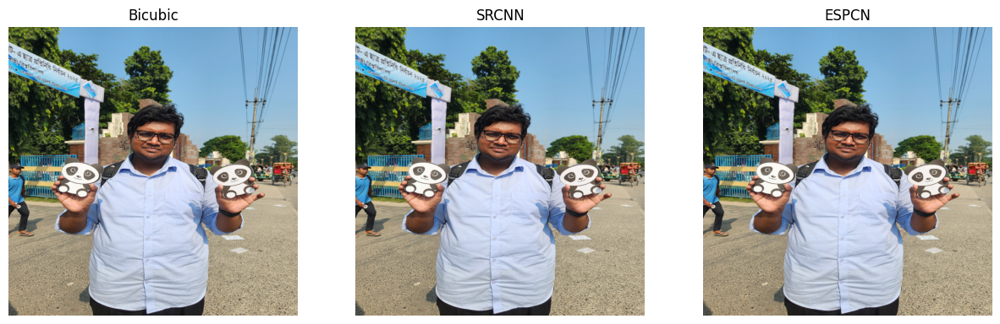

In [12]:
# Cell 12: Quick Visual Check of One Example (Notebook Display)

import matplotlib.pyplot as plt

example_name = None  # set to a base filename if you want; else auto-pick

result_files = sorted(glob.glob(os.path.join(output_dir, "*_bicubic.png")))
if not result_files:
    print("No result images found in:", output_dir)
else:
    if example_name is None:
        sample_path = result_files[0]
        base = os.path.basename(sample_path).replace("_bicubic.png", "")
    else:
        base = example_name

    bicubic_path = os.path.join(output_dir, f"{base}_bicubic.png".replace(f"_x{UPSCALE_FACTOR}", f"_x{UPSCALE_FACTOR}"))
    srcnn_path   = os.path.join(output_dir, f"{base}_srcnn.png".replace(f"_x{UPSCALE_FACTOR}", f"_x{UPSCALE_FACTOR}"))
    espcn_path   = os.path.join(output_dir, f"{base}_espcn.png".replace(f"_x{UPSCALE_FACTOR}", f"_x{UPSCALE_FACTOR}"))

    bicubic = cv2.cvtColor(cv2.imread(bicubic_path), cv2.COLOR_BGR2RGB)
    srcnn_i = cv2.cvtColor(cv2.imread(srcnn_path), cv2.COLOR_BGR2RGB)
    espcn_i = cv2.cvtColor(cv2.imread(espcn_path), cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1); plt.imshow(bicubic); plt.title("Bicubic"); plt.axis("off")
    plt.subplot(1,3,2); plt.imshow(srcnn_i); plt.title("SRCNN"); plt.axis("off")
    plt.subplot(1,3,3); plt.imshow(espcn_i); plt.title("ESPCN"); plt.axis("off")
    plt.show()


Found 9 phone test images. Evaluating all...


akif_phone_image_1: PSNR Bicubic=32.46 dB, SRCNN=32.60 dB, ESPCN=32.55 dB


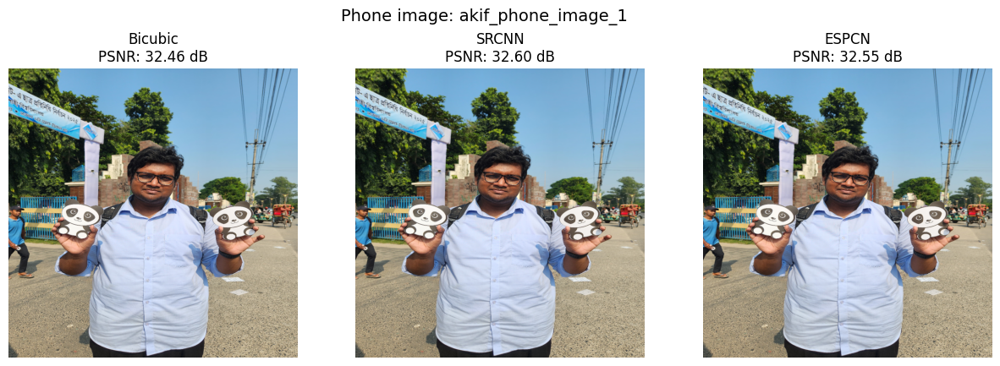

akif_phone_image_2: PSNR Bicubic=43.88 dB, SRCNN=44.35 dB, ESPCN=43.94 dB


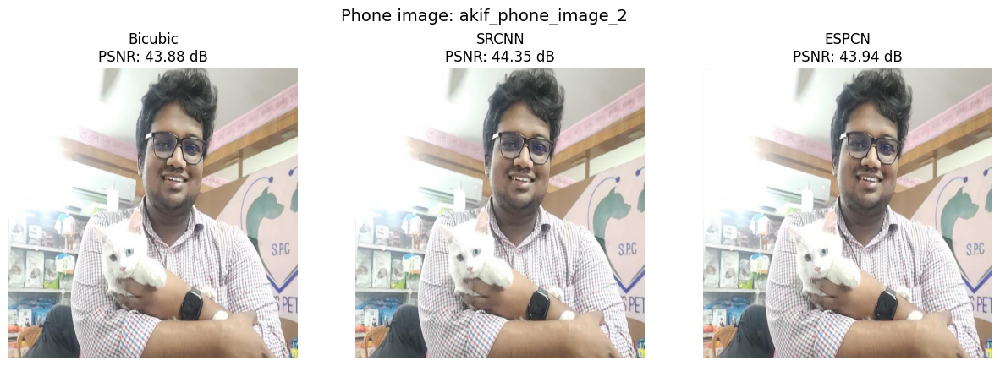

akif_phone_image_3: PSNR Bicubic=39.38 dB, SRCNN=39.53 dB, ESPCN=39.39 dB


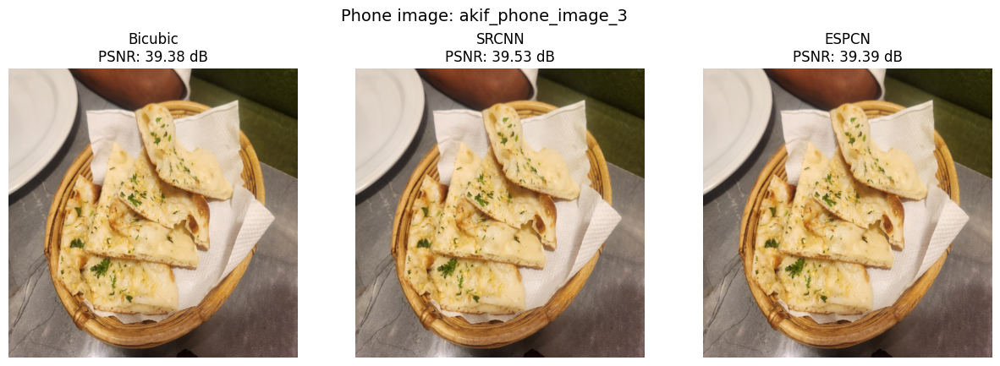

akif_phone_image_5: PSNR Bicubic=39.56 dB, SRCNN=39.67 dB, ESPCN=39.52 dB


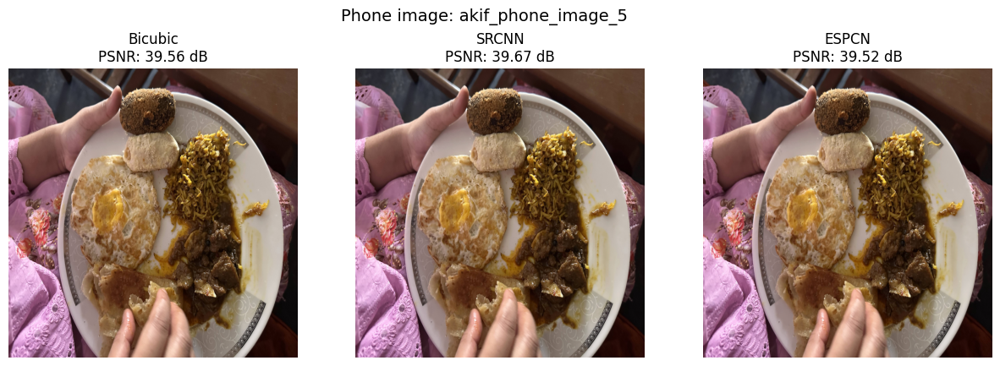

akif_phone_image_6: PSNR Bicubic=42.42 dB, SRCNN=42.85 dB, ESPCN=42.49 dB


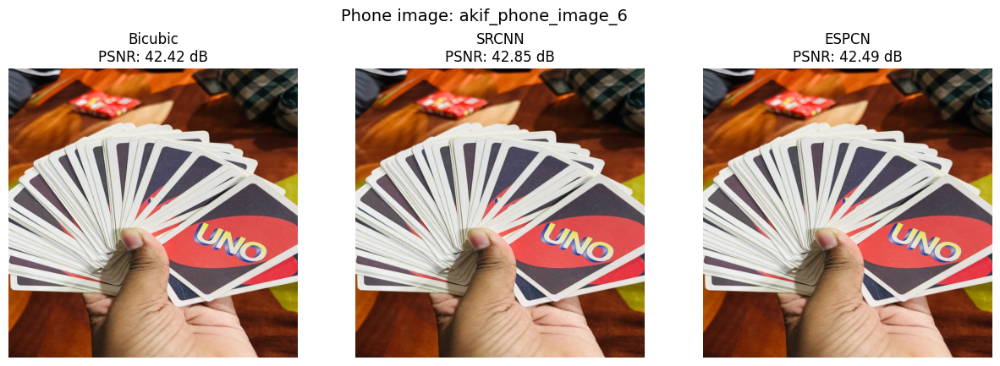

akif_phone_image_7: PSNR Bicubic=34.65 dB, SRCNN=34.93 dB, ESPCN=34.80 dB


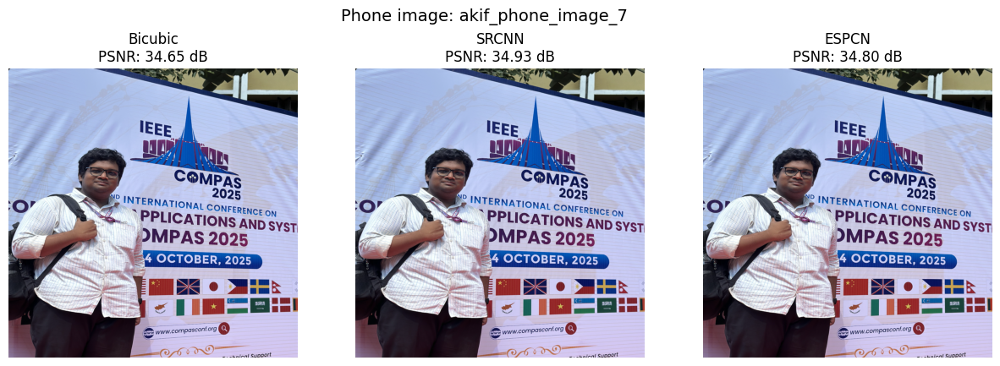

akif_phone_image_8: PSNR Bicubic=38.11 dB, SRCNN=38.25 dB, ESPCN=38.05 dB


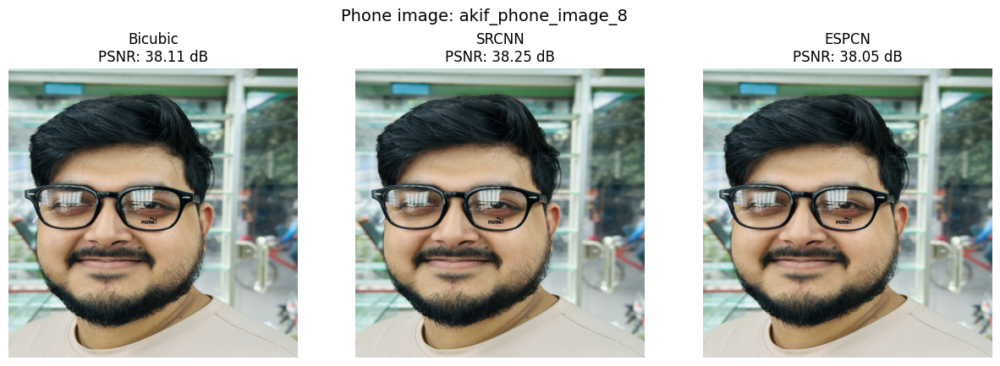

akif_phone_image_9: PSNR Bicubic=31.85 dB, SRCNN=32.06 dB, ESPCN=31.93 dB


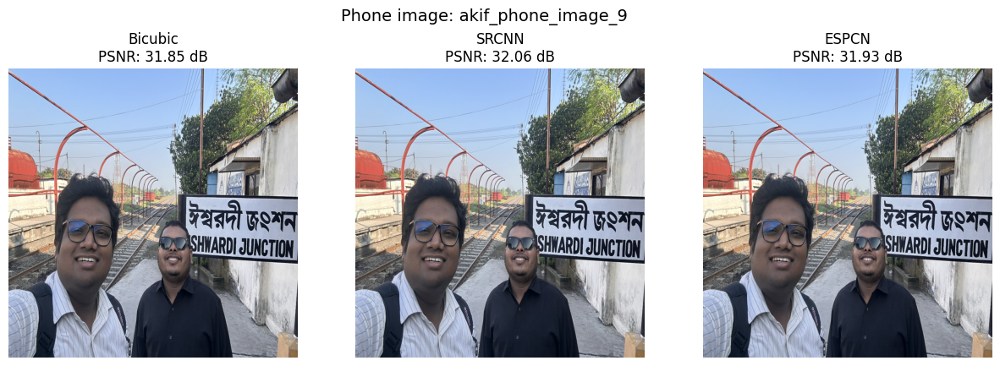

input_bus: PSNR Bicubic=39.22 dB, SRCNN=39.49 dB, ESPCN=39.33 dB


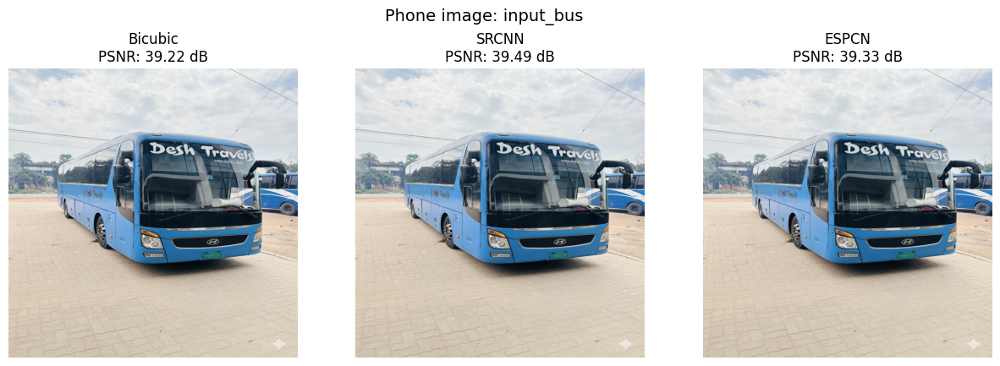

In [13]:
# Cell 12: Visual + PSNR Evaluation for ALL Phone Images

import matplotlib.pyplot as plt
import os
import glob
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

# Folder containing original HR phone images (before making LR)
phone_hr_dir = "/home/akif/ASG15/akif_photos"

# Find all bicubic result images
bicubic_files = sorted(glob.glob(os.path.join(output_dir, f"*_x{UPSCALE_FACTOR}_bicubic.png")))

if not bicubic_files:
    print("No result images found in:", output_dir)
else:
    print(f"Found {len(bicubic_files)} phone test images. Evaluating all...")

    for bicubic_path in bicubic_files:
        # base name without suffix, e.g. "LR_photo1_x2"
        base = os.path.basename(bicubic_path).replace("_bicubic.png", "")

        # matching file paths
        srcnn_path = os.path.join(output_dir, f"{base}_srcnn.png")
        espcn_path = os.path.join(output_dir, f"{base}_espcn.png")

        if not (os.path.exists(srcnn_path) and os.path.exists(espcn_path)):
            print("Skipping (missing SR files):", base)
            continue

        # read SR outputs
        bicubic = cv2.cvtColor(cv2.imread(bicubic_path), cv2.COLOR_BGR2RGB)
        srcnn_i = cv2.cvtColor(cv2.imread(srcnn_path), cv2.COLOR_BGR2RGB)
        espcn_i = cv2.cvtColor(cv2.imread(espcn_path), cv2.COLOR_BGR2RGB)

        # derive original HR filename (strip _x2 and LR_ prefix)
        orig_name = base.replace(f"_x{UPSCALE_FACTOR}", "")   # e.g. "LR_photo1"
        hr_stem = orig_name[3:] if orig_name.startswith("LR_") else orig_name

        # try different extensions to find HR file
        hr_path = None
        for ext in [".png", ".jpg", ".jpeg", ".JPG", ".JPEG"]:
            candidate = os.path.join(phone_hr_dir, hr_stem + ext)
            if os.path.exists(candidate):
                hr_path = candidate
                break

        if hr_path is None:
            print(f"[WARN] No HR file found for: {hr_stem}. PSNR skipped.")
            continue

        # read HR phone image
        hr_bgr = cv2.imread(hr_path)
        hr_rgb = cv2.cvtColor(hr_bgr, cv2.COLOR_BGR2RGB)

        # resize HR to match SR output size
        target_h, target_w = srcnn_i.shape[:2]
        hr_resized = cv2.resize(hr_rgb, (target_w, target_h), interpolation=cv2.INTER_AREA)

        # compute PSNR values
        psnr_bicubic = compare_psnr(hr_resized, bicubic, data_range=255)
        psnr_srcnn   = compare_psnr(hr_resized, srcnn_i, data_range=255)
        psnr_espcn   = compare_psnr(hr_resized, espcn_i, data_range=255)

        print(
            f"{hr_stem}: "
            f"PSNR Bicubic={psnr_bicubic:.2f} dB, "
            f"SRCNN={psnr_srcnn:.2f} dB, "
            f"ESPCN={psnr_espcn:.2f} dB"
        )

        # show side-by-side with PSNR in titles
        plt.figure(figsize=(15, 5))
        plt.suptitle(f"Phone image: {hr_stem}", fontsize=14)

        plt.subplot(1, 3, 1)
        plt.imshow(bicubic)
        plt.title(f"Bicubic\nPSNR: {psnr_bicubic:.2f} dB")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(srcnn_i)
        plt.title(f"SRCNN\nPSNR: {psnr_srcnn:.2f} dB")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(espcn_i)
        plt.title(f"ESPCN\nPSNR: {psnr_espcn:.2f} dB")
        plt.axis("off")

        plt.show()


In [14]:
# Cell 13: DIV2K Test Dataset (Full Images, No Augmentation)

# We will use the DIV2K_valid_HR folder as our TEST set.
# It still uses SRDataset, but with patch_size=None so we work on (almost) full images.

test_dataset = SRDataset(
    VAL_HR_DIR,                # same path you already set
    upscale_factor=UPSCALE_FACTOR,
    patch_size=None,           # use full image (center-cropped to be divisible by scale)
    augment=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=1,              # 1 image at a time for clean PSNR/SSIM
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

print("Number of DIV2K test images:", len(test_dataset))


Number of DIV2K test images: 100


In [15]:
# Cell 14: Quantitative Evaluation on DIV2K Test Set (PSNR & SSIM)

@torch.no_grad()
def evaluate_div2k_test(test_loader, srcnn, espcn):
    srcnn.eval()
    espcn.eval()

    total_psnr_bic, total_ssim_bic = 0.0, 0.0
    total_psnr_src, total_ssim_src = 0.0, 0.0
    total_psnr_esp, total_ssim_esp = 0.0, 0.0
    count = 0

    for bicubic, lr, hr in test_loader:
        bicubic = bicubic.to(device)
        lr = lr.to(device)
        hr = hr.to(device)

        # --- Bicubic baseline metrics ---
        for i in range(hr.size(0)):
            psnr_bic = psnr_tensors(bicubic[i], hr[i])
            ssim_bic = ssim_tensors(bicubic[i], hr[i])
            total_psnr_bic += psnr_bic
            total_ssim_bic += ssim_bic

        # --- SRCNN ---
        sr_src = srcnn(bicubic)
        for i in range(hr.size(0)):
            psnr_src = psnr_tensors(sr_src[i], hr[i])
            ssim_src = ssim_tensors(sr_src[i], hr[i])
            total_psnr_src += psnr_src
            total_ssim_src += ssim_src

        # --- ESPCN ---
        sr_esp = espcn(lr)
        for i in range(hr.size(0)):
            psnr_esp = psnr_tensors(sr_esp[i], hr[i])
            ssim_esp = ssim_tensors(sr_esp[i], hr[i])
            total_psnr_esp += psnr_esp
            total_ssim_esp += ssim_esp

        count += hr.size(0)

    avg_psnr_bic = total_psnr_bic / count
    avg_ssim_bic = total_ssim_bic / count
    avg_psnr_src = total_psnr_src / count
    avg_ssim_src = total_ssim_src / count
    avg_psnr_esp = total_psnr_esp / count
    avg_ssim_esp = total_ssim_esp / count

    print("=== DIV2K Test Set Results ===")
    print(f"Bicubic -> PSNR: {avg_psnr_bic:.2f} dB, SSIM: {avg_ssim_bic:.4f}")
    print(f"SRCNN   -> PSNR: {avg_psnr_src:.2f} dB, SSIM: {avg_ssim_src:.4f}")
    print(f"ESPCN   -> PSNR: {avg_psnr_esp:.2f} dB, SSIM: {avg_ssim_esp:.4f}")

    return {
        "bicubic": (avg_psnr_bic, avg_ssim_bic),
        "srcnn":   (avg_psnr_src, avg_ssim_src),
        "espcn":   (avg_psnr_esp, avg_ssim_esp),
    }

# Make sure Cell 9 (model loading) has been run before this.
metrics = evaluate_div2k_test(test_loader, srcnn, espcn)


=== DIV2K Test Set Results ===
Bicubic -> PSNR: 31.58 dB, SSIM: 0.9150
SRCNN   -> PSNR: 31.51 dB, SSIM: 0.9104
ESPCN   -> PSNR: 31.53 dB, SSIM: 0.9152


Showing 5 DIV2K test images with PSNR (Bicubic, SRCNN, ESPCN).
000 - 0801.png: PSNR Bicubic=34.38 dB, SRCNN=34.37 dB, ESPCN=34.32 dB


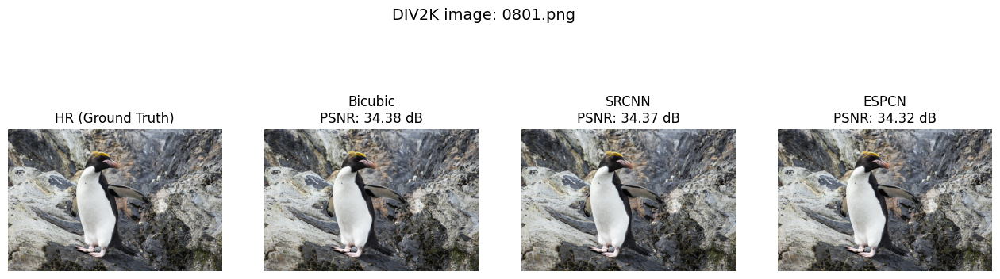

001 - 0802.png: PSNR Bicubic=39.18 dB, SRCNN=37.95 dB, ESPCN=38.76 dB


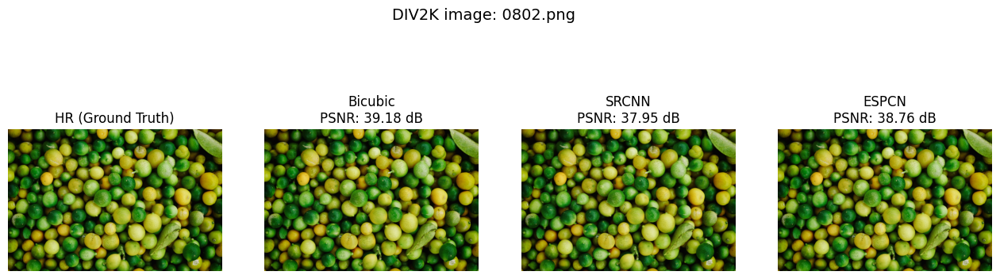

002 - 0803.png: PSNR Bicubic=41.25 dB, SRCNN=40.82 dB, ESPCN=40.67 dB


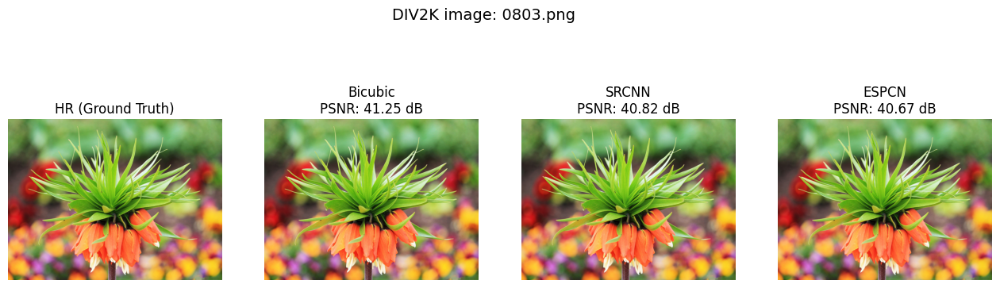

003 - 0804.png: PSNR Bicubic=30.39 dB, SRCNN=30.36 dB, ESPCN=30.41 dB


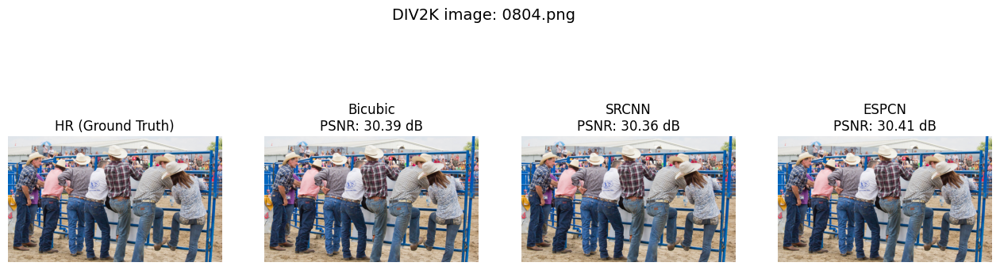

004 - 0805.png: PSNR Bicubic=32.38 dB, SRCNN=32.40 dB, ESPCN=32.41 dB


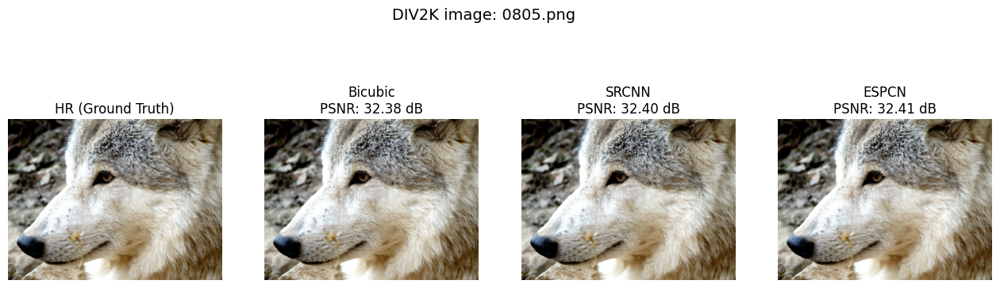

In [16]:
# Cell 15: Per-Image PSNR on DIV2K Test Set (Sample of 5 Images)

import matplotlib.pyplot as plt

@torch.no_grad()
def show_div2k_examples(test_dataset, num_examples=5):
    srcnn.eval()
    espcn.eval()

    num_examples = min(num_examples, len(test_dataset))
    print(f"Showing {num_examples} DIV2K test images with PSNR (Bicubic, SRCNN, ESPCN).")

    for idx in range(num_examples):
        # Get one sample from the dataset (bicubic, lr, hr are tensors in [0,1])
        bicubic_t, lr_t, hr_t = test_dataset[idx]

        # Add batch dimension and move to device
        bicubic_in = bicubic_t.unsqueeze(0).to(device)
        lr_in      = lr_t.unsqueeze(0).to(device)
        hr_in      = hr_t.unsqueeze(0).to(device)

        # Run models
        sr_src_t = srcnn(bicubic_in)
        sr_esp_t = espcn(lr_in)

        # Convert to uint8 images (HWC, 0–255)
        bicubic_img = tensor_to_image(bicubic_in)
        srcnn_img   = tensor_to_image(sr_src_t)
        espcn_img   = tensor_to_image(sr_esp_t)
        hr_img      = tensor_to_image(hr_in)

        # Compute PSNR for each
        psnr_bic = compare_psnr(hr_img, bicubic_img, data_range=255)
        psnr_src = compare_psnr(hr_img, srcnn_img,   data_range=255)
        psnr_esp = compare_psnr(hr_img, espcn_img,   data_range=255)

        # Get filename for display
        img_name = os.path.basename(test_dataset.hr_paths[idx])

        print(
            f"{idx:03d} - {img_name}: "
            f"PSNR Bicubic={psnr_bic:.2f} dB, "
            f"SRCNN={psnr_src:.2f} dB, "
            f"ESPCN={psnr_esp:.2f} dB"
        )

        # Plot side-by-side
        plt.figure(figsize=(16, 5))
        plt.suptitle(f"DIV2K image: {img_name}", fontsize=14)

        plt.subplot(1, 4, 1)
        plt.imshow(hr_img)
        plt.title("HR (Ground Truth)")
        plt.axis("off")

        plt.subplot(1, 4, 2)
        plt.imshow(bicubic_img)
        plt.title(f"Bicubic\nPSNR: {psnr_bic:.2f} dB")
        plt.axis("off")

        plt.subplot(1, 4, 3)
        plt.imshow(srcnn_img)
        plt.title(f"SRCNN\nPSNR: {psnr_src:.2f} dB")
        plt.axis("off")

        plt.subplot(1, 4, 4)
        plt.imshow(espcn_img)
        plt.title(f"ESPCN\nPSNR: {psnr_esp:.2f} dB")
        plt.axis("off")

        plt.show()

# Run it
show_div2k_examples(test_dataset, num_examples=5)
